Normal file: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0143_car_B2_spd_34V_mic_1.wav
Most similar anomaly file: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0003_car_B1_spd_34V_mic_1.wav (SSIM: 0.8252464743829141)
Normal file: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0741_car_D1_spd_31V_mic_1.wav
Most similar anomaly file: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0035_car_D1_spd_31V_mic_1.wav (SSIM: 0.7870992373114435)
Normal file: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0753_car_D2_spd_31V_mic_1.wav
Most similar anomaly file: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0009_car_A1_spd_28V_mic_2.wav (SSIM: 0.9824396962200342)
Normal file: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0270_car_B1_spd_40V_mic_1.wav
Most similar anomaly file: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0017_car_B2_spd_40V_mic_1.wav (SSIM: 0.8966947164

Playing Most Similar Anomaly Audio:


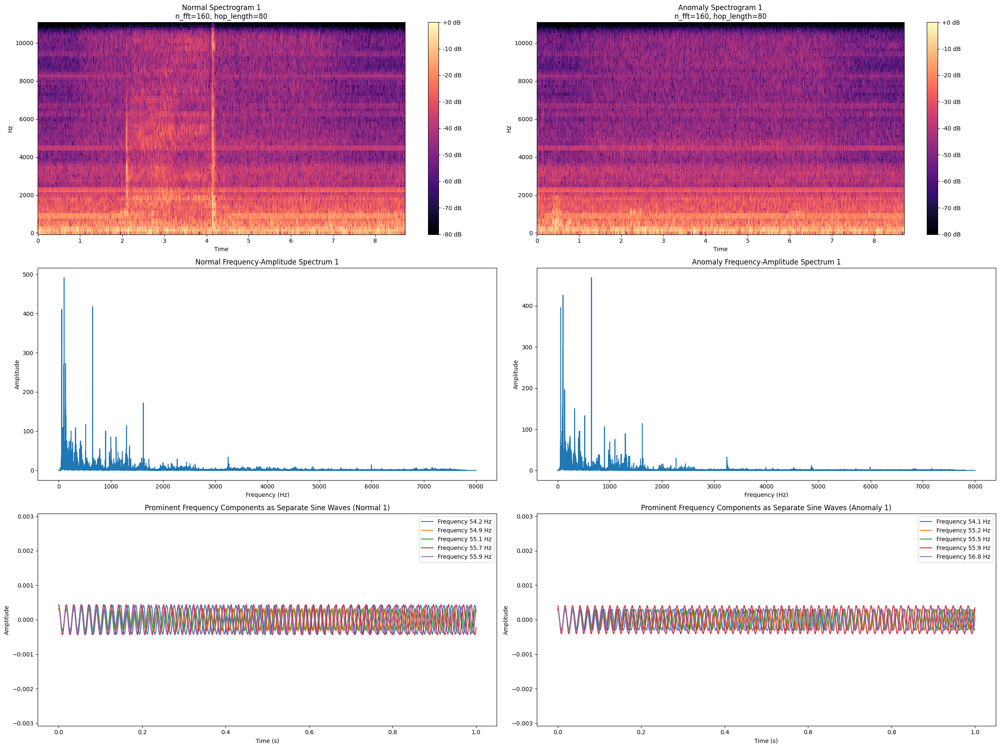


Normal file 2: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0741_car_D1_spd_31V_mic_1.wav
Most similar anomaly file 2: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0035_car_D1_spd_31V_mic_1.wav
Playing Normal Audio:


Playing Most Similar Anomaly Audio:


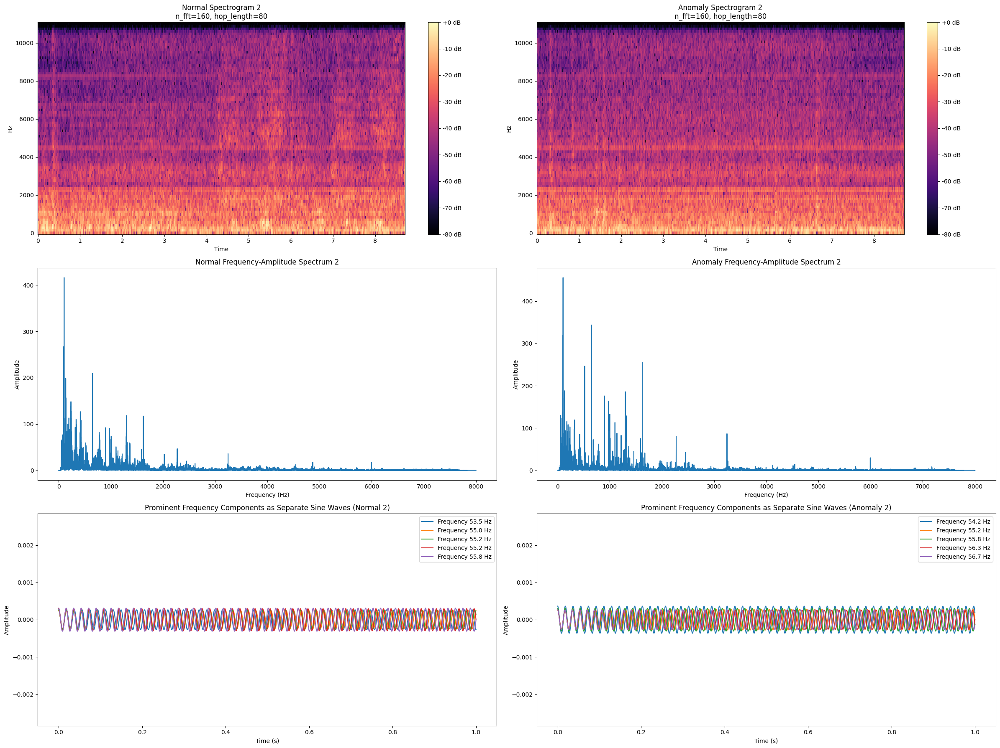


Normal file 3: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0753_car_D2_spd_31V_mic_1.wav
Most similar anomaly file 3: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0009_car_A1_spd_28V_mic_2.wav
Playing Normal Audio:


Playing Most Similar Anomaly Audio:


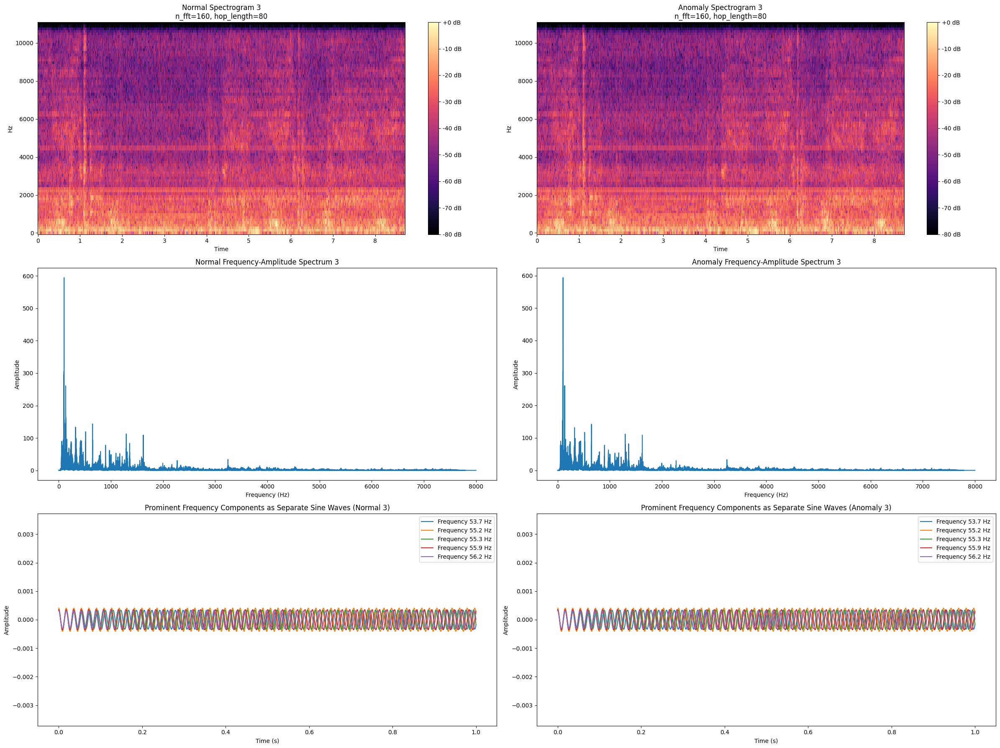


Normal file 4: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0270_car_B1_spd_40V_mic_1.wav
Most similar anomaly file 4: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0017_car_B2_spd_40V_mic_1.wav
Playing Normal Audio:


Playing Most Similar Anomaly Audio:


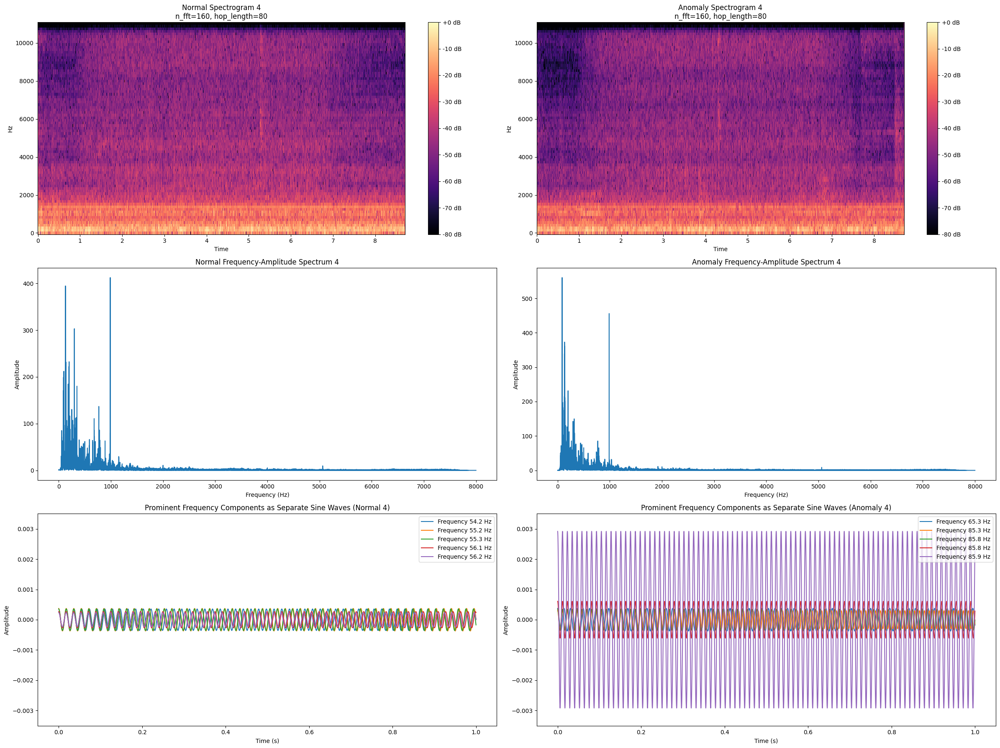


Normal file 5: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0580_car_C2_spd_40V_mic_1.wav
Most similar anomaly file 5: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0033_car_C2_spd_40V_mic_1.wav
Playing Normal Audio:


Playing Most Similar Anomaly Audio:


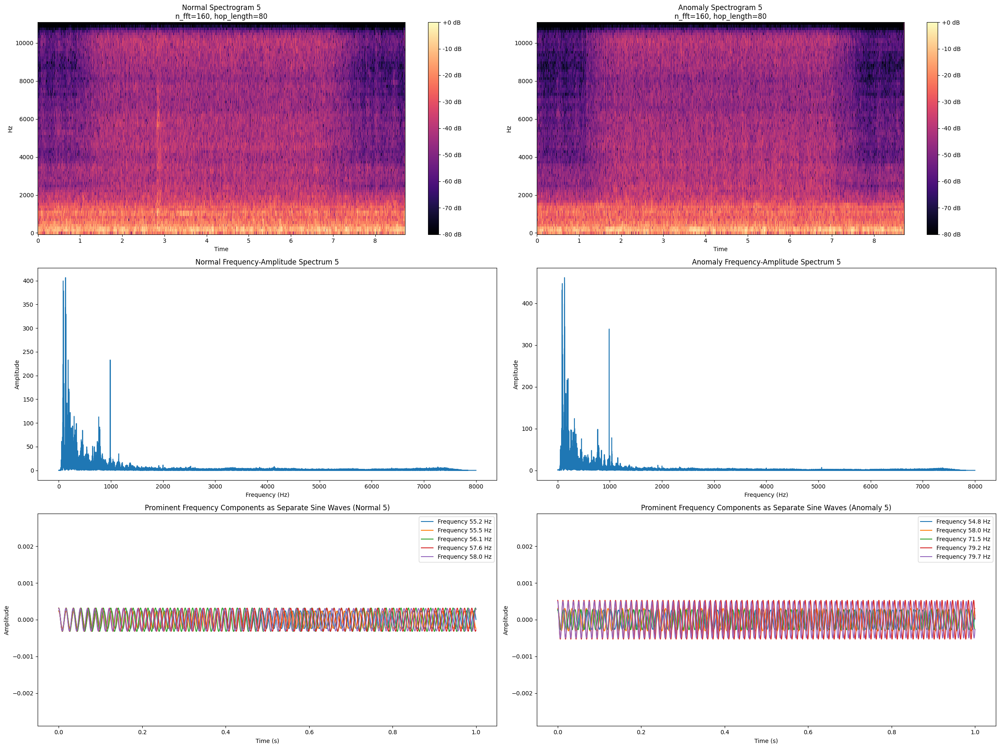

In [5]:
import os
import random
import pandas as pd
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
from IPython.display import Audio, display
import warnings

# Suppress warnings from librosa (optional)
warnings.filterwarnings('ignore')

# -----------------------------
# Configuration Parameters
# -----------------------------
DATASETS_DIR = "../../datasets/dev"  # Path to the datasets directory
CLASS_NAME = "ToyCar"                # Class to analyze
ATTRIBUTES_FILE = os.path.join(DATASETS_DIR, CLASS_NAME, "attributes_00.csv")  # Path to the attributes CSV
N_FFT = 160
HOP_LENGTH = 80
NUM_PLOTS = 5  # Number of pairs to plot

# -----------------------------
# Step 1: Load Dataset
# -----------------------------
def load_dataset(attributes_file, datasets_dir):
    if not os.path.isfile(attributes_file):
        raise FileNotFoundError(f"Attributes file not found: {attributes_file}")

    df = pd.read_csv(attributes_file)
    filenames = df['file_name'].tolist()
    labels = ['anomaly' if 'anomaly' in name.lower() else 'normal' for name in filenames]
    file_paths = [os.path.join(datasets_dir, f) for f in filenames]

    return file_paths, labels

# -----------------------------
# Step 2: Compute Spectrogram
# -----------------------------
def compute_spectrogram(y, n_fft, hop_length):
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_mag = np.abs(S)
    return S_mag

# -----------------------------
# Step 3: Find Most Similar Anomaly for Each Random Normal Sample Using SSIM
# -----------------------------
def find_most_similar_anomaly_ssim(normal_spectrogram, anomaly_spectrograms):
    max_ssim = -1
    most_similar_anomaly = None

    for anomaly_spectrogram, path in anomaly_spectrograms:
        # Calculate SSIM with data_range set to the maximum value of the normal spectrogram
        score, _ = ssim(normal_spectrogram, anomaly_spectrogram, full=True, data_range=normal_spectrogram.max())
        if score > max_ssim:
            max_ssim = score
            most_similar_anomaly = (anomaly_spectrogram, path)

    return most_similar_anomaly, max_ssim

# -----------------------------
# Step 4: Plot and Play Normal and Most Similar Anomaly Spectrograms
# -----------------------------
def plot_and_play_normal_anomaly_pairs(norm_paths, anom_paths, norm_spectrograms, anom_spectrograms, hop_length, n_fft):
    for i in range(len(norm_spectrograms)):
        # Print file paths
        print(f"\nNormal file {i + 1}: {norm_paths[i]}")
        print(f"Most similar anomaly file {i + 1}: {anom_paths[i]}")
        
        # Load and play the audio for each pair
        y_normal, sr_normal = librosa.load(norm_paths[i], sr=None)
        y_anomaly, sr_anomaly = librosa.load(anom_paths[i], sr=None)
        
        print("Playing Normal Audio:")
        display(Audio(y_normal, rate=sr_normal))
        
        print("Playing Most Similar Anomaly Audio:")
        display(Audio(y_anomaly, rate=sr_anomaly))
        
        # Compute frequency-amplitude spectrum using Fourier Transform
        fft_normal = np.fft.fft(y_normal)
        freqs_normal = np.fft.fftfreq(len(fft_normal), d=1/sr_normal)
        amplitude_normal = np.abs(fft_normal)

        fft_anomaly = np.fft.fft(y_anomaly)
        freqs_anomaly = np.fft.fftfreq(len(fft_anomaly), d=1/sr_anomaly)
        amplitude_anomaly = np.abs(fft_anomaly)

        # Display spectrogram and frequency-amplitude plots
        plt.figure(figsize=(24, 18))

        # Plot Normal Spectrogram
        plt.subplot(3, 2, 1)
        S_db = librosa.amplitude_to_db(norm_spectrograms[i], ref=np.max)
        librosa.display.specshow(S_db, hop_length=hop_length, x_axis='time', y_axis='linear')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Normal Spectrogram {i + 1}\nn_fft={n_fft}, hop_length={hop_length}')

        # Plot Anomaly Spectrogram
        plt.subplot(3, 2, 2)
        S_db = librosa.amplitude_to_db(anom_spectrograms[i], ref=np.max)
        librosa.display.specshow(S_db, hop_length=hop_length, x_axis='time', y_axis='linear')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Anomaly Spectrogram {i + 1}\nn_fft={n_fft}, hop_length={hop_length}')

        # Plot Frequency-Amplitude Spectrum for Normal
        plt.subplot(3, 2, 3)
        plt.plot(freqs_normal[:len(freqs_normal)//2], amplitude_normal[:len(amplitude_normal)//2])
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.title(f'Normal Frequency-Amplitude Spectrum {i + 1}')

        # Plot Frequency-Amplitude Spectrum for Anomaly
        plt.subplot(3, 2, 4)
        plt.plot(freqs_anomaly[:len(freqs_anomaly)//2], amplitude_anomaly[:len(amplitude_anomaly)//2])
        plt.xlabel("Frequency (Hz)")
        plt.ylabel("Amplitude")
        plt.title(f'Anomaly Frequency-Amplitude Spectrum {i + 1}')

        # Define a fixed y-axis limit for sine wave plots
        y_limit = max(np.max(amplitude_normal[:len(amplitude_normal)//2]), np.max(amplitude_anomaly[:len(amplitude_anomaly)//2])) / len(y_normal)
        y_limit = y_limit * 1.2  # Add a 20% margin for better visualization

        # Plot prominent sine waves for Normal
        plt.subplot(3, 2, 5)
        threshold = np.max(amplitude_normal) * 0.1  # Only keep frequencies with at least 10% of max amplitude
        prominent_freqs = freqs_normal[amplitude_normal > threshold]
        prominent_amps = amplitude_normal[amplitude_normal > threshold]
        t = np.linspace(0, 1, int(sr_normal), endpoint=False)
        
        for j, (freq, amp) in enumerate(zip(prominent_freqs[:5], prominent_amps[:5])):  # Limit to top 5 frequencies
            sine_wave = (amp / len(y_normal)) * np.cos(2 * np.pi * freq * t)
            plt.plot(t, sine_wave, label=f'Frequency {freq:.1f} Hz')
        
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.ylim(-y_limit, y_limit)  # Set fixed y-axis limit
        plt.title(f'Prominent Frequency Components as Separate Sine Waves (Normal {i + 1})')
        plt.legend()

        # Plot prominent sine waves for Anomaly
        plt.subplot(3, 2, 6)
        threshold = np.max(amplitude_anomaly) * 0.1
        prominent_freqs = freqs_anomaly[amplitude_anomaly > threshold]
        prominent_amps = amplitude_anomaly[amplitude_anomaly > threshold]
        
        for j, (freq, amp) in enumerate(zip(prominent_freqs[:5], prominent_amps[:5])):
            sine_wave = (amp / len(y_anomaly)) * np.cos(2 * np.pi * freq * t)
            plt.plot(t, sine_wave, label=f'Frequency {freq:.1f} Hz')
        
        plt.xlabel("Time (s)")
        plt.ylabel("Amplitude")
        plt.ylim(-y_limit, y_limit)  # Set fixed y-axis limit
        plt.title(f'Prominent Frequency Components as Separate Sine Waves (Anomaly {i + 1})')
        plt.legend()

        plt.tight_layout()
        plt.show()  # Show plot after audio is played




# -----------------------------
# Main Execution Flow
# -----------------------------
def main():
    # Step 1: Load Dataset
    file_paths, labels = load_dataset(ATTRIBUTES_FILE, DATASETS_DIR)

    # Separate files by label
    normal_paths = [path for path, label in zip(file_paths, labels) if label == 'normal']
    anomaly_paths = [path for path, label in zip(file_paths, labels) if label == 'anomaly']

    # Select a random sample of normal files
    random_normal_paths = random.sample(normal_paths, min(NUM_PLOTS, len(normal_paths)))
    
    # Compute spectrograms for anomaly samples
    anomaly_spectrograms = []
    for path in anomaly_paths:
        y, sr = librosa.load(path, sr=None)
        S_anomaly = compute_spectrogram(y, N_FFT, HOP_LENGTH)
        anomaly_spectrograms.append((S_anomaly, path))
    
    # Find the most similar anomaly for each random normal sample
    normal_spectrograms = []
    similar_anomaly_spectrograms = []
    similar_anomaly_paths = []
    for normal_path in random_normal_paths:
        y_normal, sr_normal = librosa.load(normal_path, sr=None)
        S_normal = compute_spectrogram(y_normal, N_FFT, HOP_LENGTH)
        normal_spectrograms.append(S_normal)

        # Find the most similar anomaly spectrogram based on SSIM
        most_similar_anomaly, max_ssim = find_most_similar_anomaly_ssim(S_normal, anomaly_spectrograms)
        similar_anomaly_spectrograms.append(most_similar_anomaly[0])
        similar_anomaly_paths.append(most_similar_anomaly[1])

        print(f"Normal file: {normal_path}")
        print(f"Most similar anomaly file: {most_similar_anomaly[1]} (SSIM: {max_ssim})")

    # Plot and play the pairs
    plot_and_play_normal_anomaly_pairs(random_normal_paths, similar_anomaly_paths, normal_spectrograms, similar_anomaly_spectrograms, HOP_LENGTH, N_FFT)

if __name__ == "__main__":
    main()


Anomaly file: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0029_car_E1_spd_37V_mic_2.wav
Matching normal file: ../../datasets/dev/ToyCar/test/section_00_target_test_normal_0029_car_E1_spd_28V_mic_2.wav
Anomaly file: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0001_car_B1_spd_31V_mic_1.wav
Matching normal file: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0001_car_B1_spd_31V_mic_1.wav
Anomaly file: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0036_car_E1_spd_37V_mic_2.wav
Matching normal file: ../../datasets/dev/ToyCar/test/section_00_target_test_normal_0036_car_E1_spd_28V_mic_2.wav
Anomaly file: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0005_car_A1_spd_37V_mic_2.wav
Matching normal file: ../../datasets/dev/ToyCar/train/section_00_target_train_normal_0005_car_A1_spd_37V_mic_2.wav
No matching normal file found for anomaly file: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0018_car_A

Playing Matching Normal Audio:


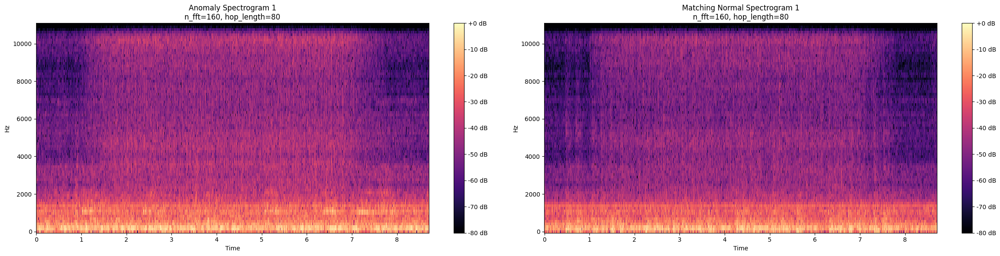


Anomaly file 2: ../../datasets/dev/ToyCar/test/section_00_source_test_anomaly_0001_car_B1_spd_31V_mic_1.wav
Matching normal file 2: ../../datasets/dev/ToyCar/train/section_00_source_train_normal_0001_car_B1_spd_31V_mic_1.wav
Playing Anomaly Audio:


Playing Matching Normal Audio:


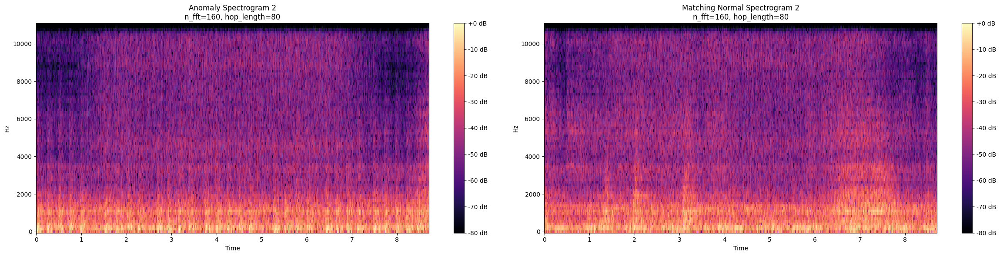


Anomaly file 3: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0036_car_E1_spd_37V_mic_2.wav
Matching normal file 3: ../../datasets/dev/ToyCar/test/section_00_target_test_normal_0036_car_E1_spd_28V_mic_2.wav
Playing Anomaly Audio:


Playing Matching Normal Audio:


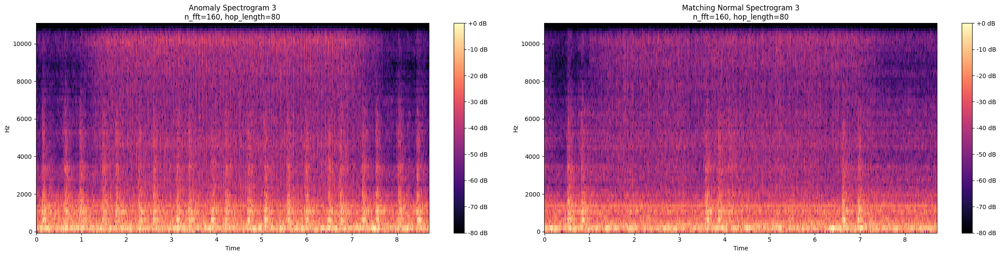


Anomaly file 4: ../../datasets/dev/ToyCar/test/section_00_target_test_anomaly_0005_car_A1_spd_37V_mic_2.wav
Matching normal file 4: ../../datasets/dev/ToyCar/train/section_00_target_train_normal_0005_car_A1_spd_37V_mic_2.wav
Playing Anomaly Audio:


Playing Matching Normal Audio:


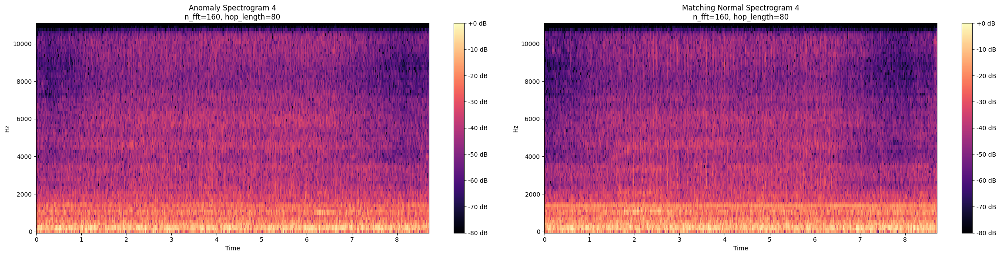

In [10]:
import os
import random
import pandas as pd
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import warnings

# Suppress warnings from librosa (optional)
warnings.filterwarnings('ignore')

# -----------------------------
# Configuration Parameters
# -----------------------------
DATASETS_DIR = "../../datasets/dev"  # Path to the datasets directory
CLASS_NAME = "ToyCar"                # Class to analyze
ATTRIBUTES_FILE = os.path.join(DATASETS_DIR, CLASS_NAME, "attributes_00.csv")  # Path to the attributes CSV
N_FFT = 160
HOP_LENGTH = 80
NUM_PLOTS = 5  # Number of pairs to plot

# -----------------------------
# Step 1: Load Dataset
# -----------------------------
def load_dataset(attributes_file, datasets_dir):
    if not os.path.isfile(attributes_file):
        raise FileNotFoundError(f"Attributes file not found: {attributes_file}")

    df = pd.read_csv(attributes_file)
    filenames = df['file_name'].tolist()
    labels = ['anomaly' if 'anomaly' in name.lower() else 'normal' for name in filenames]
    
    # 수정된 부분: CLASS_NAME을 경로에 추가하지 않음
    file_paths = [os.path.join(datasets_dir, f) for f in filenames]

    return file_paths, labels


# -----------------------------
# Step 2: Compute Spectrogram
# -----------------------------
def compute_spectrogram(y, n_fft, hop_length):
    S = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_mag = np.abs(S)
    return S_mag

# -----------------------------
# Step 3: Find Corresponding Normal File for Each Anomaly Based on Exact Code Name and File Number
# -----------------------------
def find_matching_normal_file(anomaly_path, normal_paths):
    # Extract the file name from the path
    anomaly_filename = os.path.basename(anomaly_path)
    anomaly_parts = anomaly_filename.split("_")
    
    # Extract the file number and code name from the anomaly file name
    anomaly_number = anomaly_parts[5]  # File number, e.g., '0024'
    anomaly_code = anomaly_parts[7]    # Code name, e.g., 'C2'
    
    # Find a normal file with the exact same code name and file number
    for normal_path in normal_paths:
        normal_filename = os.path.basename(normal_path)
        normal_parts = normal_filename.split("_")
        normal_number = normal_parts[5]
        normal_code = normal_parts[7]
        
        if anomaly_number == normal_number and anomaly_code == normal_code:
            return normal_path
    return None

# -----------------------------
# Step 4: Plot and Play Normal and Matching Anomaly Spectrograms
# -----------------------------
def plot_and_play_normal_anomaly_pairs(anom_paths, norm_paths, anom_spectrograms, norm_spectrograms, hop_length, n_fft):
    for i in range(len(anom_spectrograms)):
        # Print file paths
        print(f"\nAnomaly file {i + 1}: {anom_paths[i]}")
        print(f"Matching normal file {i + 1}: {norm_paths[i]}")
        
        # Load and play the audio for each pair
        y_anomaly, sr_anomaly = librosa.load(anom_paths[i], sr=None)
        y_normal, sr_normal = librosa.load(norm_paths[i], sr=None)
        
        print("Playing Anomaly Audio:")
        display(Audio(y_anomaly, rate=sr_anomaly))
        
        print("Playing Matching Normal Audio:")
        display(Audio(y_normal, rate=sr_normal))
        
        # Display spectrogram images after playing the audio
        plt.figure(figsize=(24, 6))  # Adjust size for each pair

        # Plot Anomaly Spectrogram
        plt.subplot(1, 2, 1)
        S_db = librosa.amplitude_to_db(anom_spectrograms[i], ref=np.max)
        librosa.display.specshow(S_db, hop_length=hop_length, x_axis='time', y_axis='linear')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Anomaly Spectrogram {i + 1}\nn_fft={n_fft}, hop_length={hop_length}')

        # Plot Matching Normal Spectrogram
        plt.subplot(1, 2, 2)
        S_db = librosa.amplitude_to_db(norm_spectrograms[i], ref=np.max)
        librosa.display.specshow(S_db, hop_length=hop_length, x_axis='time', y_axis='linear')
        plt.colorbar(format='%+2.0f dB')
        plt.title(f'Matching Normal Spectrogram {i + 1}\nn_fft={n_fft}, hop_length={hop_length}')
        
        plt.tight_layout()
        plt.show()  # Show plot after audio is played

# -----------------------------
# Main Execution Flow
# -----------------------------
def main():
    # Step 1: Load Dataset
    file_paths, labels = load_dataset(ATTRIBUTES_FILE, DATASETS_DIR)

    # Separate files by label
    normal_paths = [path for path, label in zip(file_paths, labels) if label == 'normal']
    anomaly_paths = [path for path, label in zip(file_paths, labels) if label == 'anomaly']

    # Select a random sample of anomaly files
    random_anomaly_paths = random.sample(anomaly_paths, min(NUM_PLOTS, len(anomaly_paths)))
    
    # Find matching normal files and compute spectrograms
    matching_normal_paths = []
    anomaly_spectrograms = []
    normal_spectrograms = []
    
    for anomaly_path in random_anomaly_paths:
        # Find a matching normal file with the exact same code name and file number
        matching_normal_path = find_matching_normal_file(anomaly_path, normal_paths)
        if matching_normal_path:
            matching_normal_paths.append(matching_normal_path)
            
            # Compute spectrograms for anomaly and matching normal files
            y_anomaly, sr_anomaly = librosa.load(anomaly_path, sr=None)
            y_normal, sr_normal = librosa.load(matching_normal_path, sr=None)
            
            S_anomaly = compute_spectrogram(y_anomaly, N_FFT, HOP_LENGTH)
            S_normal = compute_spectrogram(y_normal, N_FFT, HOP_LENGTH)
            
            anomaly_spectrograms.append(S_anomaly)
            normal_spectrograms.append(S_normal)

            print(f"Anomaly file: {anomaly_path}")
            print(f"Matching normal file: {matching_normal_path}")
        else:
            print(f"No matching normal file found for anomaly file: {anomaly_path}")

    # Plot and play the pairs
    plot_and_play_normal_anomaly_pairs(random_anomaly_paths, matching_normal_paths, anomaly_spectrograms, normal_spectrograms, HOP_LENGTH, N_FFT)

if __name__ == "__main__":
    main()
